In [1]:
# !pip install chardet

import pandas as pd
import chardet

In [3]:
file_path = 'public_assistance.csv'
with open(file_path, 'rb') as f:
    result = chardet.detect(f.read())
    detected_encoding = result['encoding']
    print(f'Detected encoding: {detected_encoding}')

Detected encoding: utf-8


In [4]:
with open(file_path, 'r', encoding=detected_encoding) as f:
    content = f.read()
    print(content[:500])

GENESIS-Tabelle: 22111-0022
Public assistance gross expenditure, revenue,;;;;;;
net expenditure: L�nder, years, types of public assistance;;;;;;
Public assistance expenditure and revenue;;;;;;
;;;;Gross expenditure;Revenue;Net expenditure
;;;;Tsd. EUR;Tsd. EUR;Tsd. EUR
2022;Baden-W�rttemberg;SOZ-03;Subsistence payments;116383;11065;105318
2022;Baden-W�rttemberg;SOZ-04;Basic sec.benefits in old age,red.earning capacity;-;-;-
2022;Baden-W�rttemberg;SOZ-05;Assistance towards healthcare;47212;367;46


In [5]:
df = pd.read_csv(file_path, encoding=detected_encoding, delimiter=';', skiprows=5)
df.columns = ["Year", "Länder", "TypeCode", "PublicAssistance", "Expenditure(TEUR)", "Revenue(TEUR)", "NetExpenditure(TEUR)"]

df.head(20)

,Year,Länder,TypeCode,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,2022,Baden-W�rttemberg,SOZ-03,Subsistence payments,116383,11065,105318
1,2022,Baden-W�rttemberg,SOZ-04,"Basic sec.benefits in old age,red.earning capa...",-,-,-
2,2022,Baden-W�rttemberg,SOZ-05,Assistance towards healthcare,47212,367,46845
3,2022,Baden-W�rttemberg,SOZ-06,Integration assistance for disabled people,-,-,-
4,2022,Baden-W�rttemberg,SOZ-07,Assistance for nursing care,466954,46504,420450
5,2022,Baden-W�rttemberg,SOZ-08-09,Assist.in overcoming special soc.difficulties ...,76574,2404,74170
6,2022,Baden-W�rttemberg,NaN,Total,707123,60339,646784
7,2022,Bayern,SOZ-03,Subsistence payments,170878,10289,160589
8,2022,Bayern,SOZ-04,"Basic sec.benefits in old age,red.earning capa...",-,-,-
9,2022,Bayern,SOZ-05,Assistance towards healthcare,94176,885,93291


In [6]:
df.dtypes

Year                     int64
Länder                  object
TypeCode                object
PublicAssistance        object
Expenditure(TEUR)       object
Revenue(TEUR)           object
NetExpenditure(TEUR)    object
dtype: object

In [7]:
# Convert the column using pd.to_numeric with errors='coerce' to handle non-numeric values
df['Expenditure(TEUR)'] = pd.to_numeric(df['Expenditure(TEUR)'], errors='coerce')
df['Revenue(TEUR)'] = pd.to_numeric(df['Revenue(TEUR)'], errors='coerce')
df['NetExpenditure(TEUR)'] = pd.to_numeric(df['NetExpenditure(TEUR)'], errors='coerce')
print("\nDataFrame after conversion using pd.to_numeric():")


df = df.fillna(0)

df[["Expenditure(TEUR)", "Revenue(TEUR)", "NetExpenditure(TEUR)"]].head(25)


DataFrame after conversion using pd.to_numeric():


,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,116383.0,11065.0,105318.0
1,0.0,0.0,0.0
2,47212.0,367.0,46845.0
3,0.0,0.0,0.0
4,466954.0,46504.0,420450.0
5,76574.0,2404.0,74170.0
6,707123.0,60339.0,646784.0
7,170878.0,10289.0,160589.0
8,0.0,0.0,0.0
9,94176.0,885.0,93291.0


In [8]:
df = df[~df.apply(lambda row: row.astype(str).str.contains('Total').any(), axis=1)]

df.reset_index(drop=True, inplace=True)

df.head(50)

,Year,Länder,TypeCode,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,2022,Baden-W�rttemberg,SOZ-03,Subsistence payments,116383.0,11065.0,105318.0
1,2022,Baden-W�rttemberg,SOZ-04,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0
2,2022,Baden-W�rttemberg,SOZ-05,Assistance towards healthcare,47212.0,367.0,46845.0
3,2022,Baden-W�rttemberg,SOZ-06,Integration assistance for disabled people,0.0,0.0,0.0
4,2022,Baden-W�rttemberg,SOZ-07,Assistance for nursing care,466954.0,46504.0,420450.0
5,2022,Baden-W�rttemberg,SOZ-08-09,Assist.in overcoming special soc.difficulties ...,76574.0,2404.0,74170.0
6,2022,Bayern,SOZ-03,Subsistence payments,170878.0,10289.0,160589.0
7,2022,Bayern,SOZ-04,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0
8,2022,Bayern,SOZ-05,Assistance towards healthcare,94176.0,885.0,93291.0
9,2022,Bayern,SOZ-06,Integration assistance for disabled people,0.0,0.0,0.0


In [9]:
df["Year"].unique()

array([2022])

In [10]:
df["Länder"] = df["Länder"].astype(str)
df["Länder"].head(25)

0     Baden-W�rttemberg
1     Baden-W�rttemberg
2     Baden-W�rttemberg
3     Baden-W�rttemberg
4     Baden-W�rttemberg
5     Baden-W�rttemberg
6                Bayern
7                Bayern
8                Bayern
9                Bayern
10               Bayern
11               Bayern
12               Berlin
13               Berlin
14               Berlin
15               Berlin
16               Berlin
17               Berlin
18          Brandenburg
19          Brandenburg
20          Brandenburg
21          Brandenburg
22          Brandenburg
23          Brandenburg
24               Bremen
Name: Länder, dtype: object

In [11]:
# Group by 'Region' and sum the relevant columns
grouped_df = df.groupby('Länder')[['Expenditure(TEUR)', 'Revenue(TEUR)', 'NetExpenditure(TEUR)']].sum().reset_index()

print("\nGrouped DataFrame with sums:")
grouped_df.head(50)


Grouped DataFrame with sums:


,Länder,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,Baden-W�rttemberg,707123.0,60340.0,646783.0
1,Bayern,1188934.0,335427.0,853506.0
2,Berlin,511678.0,13944.0,497734.0
3,Brandenburg,130417.0,6931.0,123486.0
4,Bremen,93367.0,4412.0,88956.0
5,Hamburg,306339.0,3842.0,302497.0
6,Hessen,629997.0,76615.0,553383.0
7,Mecklenburg-Vorpommern,109061.0,5706.0,103353.0
8,Niedersachsen,566019.0,22693.0,543326.0
9,Nordrhein-Westfalen,1596217.0,110177.0,1486041.0


In [12]:
import pandas as pd
from urllib.request import urlopen
import json
import plotly.express as px


# Load GeoJSON data for German states
with urlopen('https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/1_sehr_hoch.geo.json') as response:
    counties = json.load(response)

# Create choropleth map
fig = px.choropleth(grouped_df, geojson=counties, locations='Länder', featureidkey="properties.name",
                    color='NetExpenditure(TEUR)',
                    labels={'NetExpenditure(TEUR)': 'Net Expenditure (TEUR)'},
                    title="Net Expenditure by State in Germany",
                    color_continuous_scale="plasma",
                    range_color=(0, grouped_df['NetExpenditure(TEUR)'].max())
                   )

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    plot_bgcolor='rgba(0, 0, 0, 0)',
    paper_bgcolor='rgba(0, 0, 0, 0)',
    margin=dict(l=0, r=0, t=50, b=0),
    height=350,
    template="plotly_dark"    
)
fig.show()

In [13]:
type_grouped_df = df.groupby('PublicAssistance')[['Expenditure(TEUR)', 'Revenue(TEUR)', 'NetExpenditure(TEUR)']].sum().reset_index()

print("\nGrouped DataFrame with sums:")
type_grouped_df.head(50)


Grouped DataFrame with sums:


,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,Assist.in overcoming special soc.difficulties ...,649252.0,37260.0,611991.0
1,Assistance for nursing care,4098221.0,579065.0,3519155.0
2,Assistance towards healthcare,736201.0,12260.0,723943.0
3,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0
4,Integration assistance for disabled people,0.0,0.0,0.0
5,Subsistence payments,1365052.0,90361.0,1274692.0


In [14]:
df_sorted = type_grouped_df.sort_values(by="NetExpenditure(TEUR)", ascending=False)
df_sorted.head()

,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
1,Assistance for nursing care,4098221.0,579065.0,3519155.0
5,Subsistence payments,1365052.0,90361.0,1274692.0
2,Assistance towards healthcare,736201.0,12260.0,723943.0
0,Assist.in overcoming special soc.difficulties ...,649252.0,37260.0,611991.0
3,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0


In [15]:
df.head(25)

,Year,Länder,TypeCode,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,2022,Baden-W�rttemberg,SOZ-03,Subsistence payments,116383.0,11065.0,105318.0
1,2022,Baden-W�rttemberg,SOZ-04,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0
2,2022,Baden-W�rttemberg,SOZ-05,Assistance towards healthcare,47212.0,367.0,46845.0
3,2022,Baden-W�rttemberg,SOZ-06,Integration assistance for disabled people,0.0,0.0,0.0
4,2022,Baden-W�rttemberg,SOZ-07,Assistance for nursing care,466954.0,46504.0,420450.0
5,2022,Baden-W�rttemberg,SOZ-08-09,Assist.in overcoming special soc.difficulties ...,76574.0,2404.0,74170.0
6,2022,Bayern,SOZ-03,Subsistence payments,170878.0,10289.0,160589.0
7,2022,Bayern,SOZ-04,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0
8,2022,Bayern,SOZ-05,Assistance towards healthcare,94176.0,885.0,93291.0
9,2022,Bayern,SOZ-06,Integration assistance for disabled people,0.0,0.0,0.0


In [16]:
df[df['PublicAssistance'] == 'Subsistence payments'].head(10)

,Year,Länder,TypeCode,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR)
0,2022,Baden-W�rttemberg,SOZ-03,Subsistence payments,116383.0,11065.0,105318.0
6,2022,Bayern,SOZ-03,Subsistence payments,170878.0,10289.0,160589.0
12,2022,Berlin,SOZ-03,Subsistence payments,72749.0,3455.0,69294.0
18,2022,Brandenburg,SOZ-03,Subsistence payments,30632.0,1964.0,28668.0
24,2022,Bremen,SOZ-03,Subsistence payments,21739.0,1452.0,20287.0
30,2022,Hamburg,SOZ-03,Subsistence payments,38054.0,2468.0,35586.0
36,2022,Hessen,SOZ-03,Subsistence payments,156348.0,11641.0,144707.0
42,2022,Mecklenburg-Vorpommern,SOZ-03,Subsistence payments,28594.0,1857.0,26736.0
48,2022,Niedersachsen,SOZ-03,Subsistence payments,139142.0,8220.0,130922.0
54,2022,Nordrhein-Westfalen,SOZ-03,Subsistence payments,341732.0,21753.0,319980.0


/var/folders/kl/ftnvfq4d77748t3dnrc500jr0000gn/T/ipykernel_65928/2303552313.py:18: UserWarning:

Glyph 65533 (\N{REPLACEMENT CHARACTER}) missing from font(s) Arial.

/opt/miniconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 65533 (\N{REPLACEMENT CHARACTER}) missing from font(s) Arial.



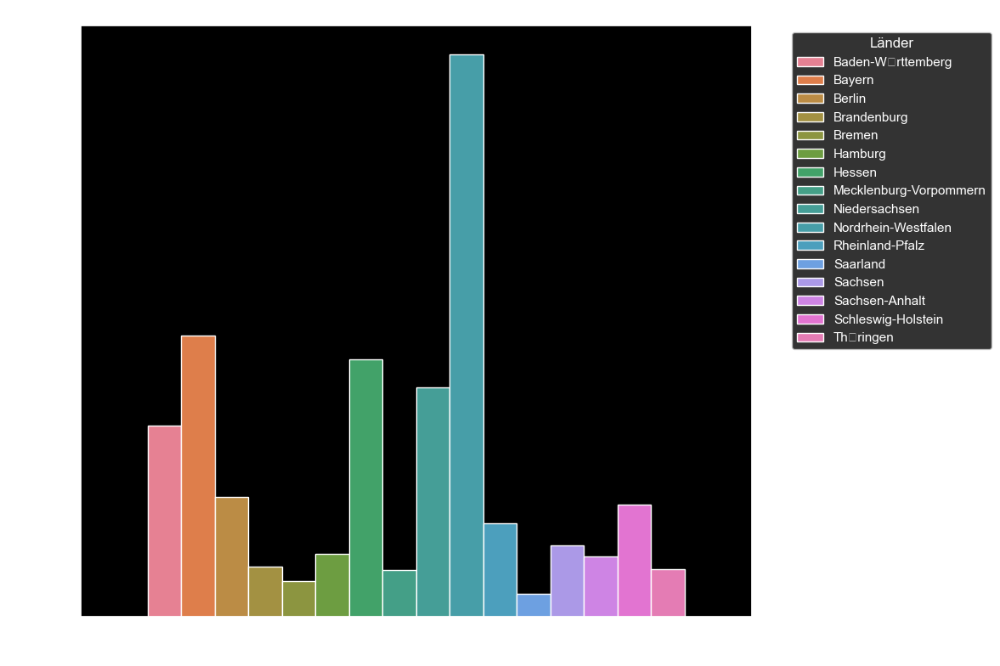

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

pa_filtered_df = df[df['PublicAssistance'] == 'Subsistence payments']

plt.figure(figsize=(12, 8))
sns.set(style="dark", palette="dark")
plt.style.use('dark_background')


sns.barplot(data=pa_filtered_df, x='PublicAssistance', y='Expenditure(TEUR)', hue='Länder', dodge=True)
plt.title('Expenditure by Public Assistance and Länder')
plt.xlabel('Public Assistance')
plt.ylabel('Expenditure (TEUR)')
plt.xticks(rotation=0, ha='right', color='white')  # X-axis tick label color customization
plt.yticks(color='white')
plt.legend(title='Länder', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/var/folders/kl/ftnvfq4d77748t3dnrc500jr0000gn/T/ipykernel_65928/3155784090.py:15: UserWarning:

Glyph 65533 (\N{REPLACEMENT CHARACTER}) missing from font(s) Arial.

/opt/miniconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 65533 (\N{REPLACEMENT CHARACTER}) missing from font(s) Arial.



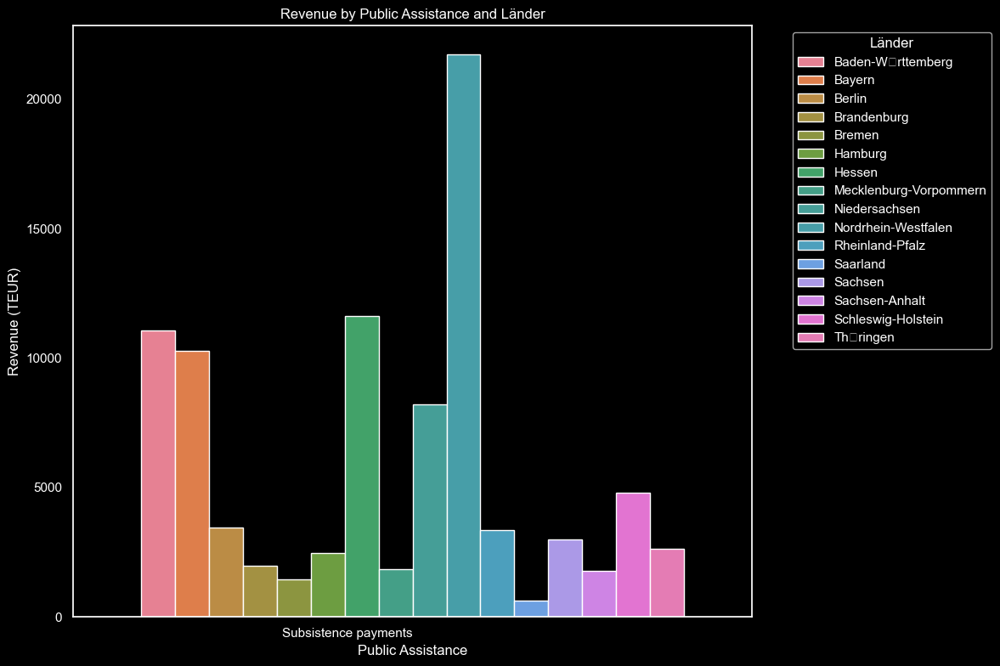

In [18]:
pa_filtered_df = df[df['PublicAssistance'] == 'Subsistence payments']

plt.figure(figsize=(12, 8))
sns.set(style="dark", palette="dark")
plt.style.use('dark_background')


sns.barplot(data=pa_filtered_df, x='PublicAssistance', y='Revenue(TEUR)', hue='Länder', dodge=True)
plt.title('Revenue by Public Assistance and Länder')
plt.xlabel('Public Assistance')
plt.ylabel('Revenue (TEUR)')
plt.xticks(rotation=0, ha='right', color='white')  # X-axis tick label color customization
plt.yticks(color='white')
plt.legend(title='Länder', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [19]:
# Donut Chart

pa_type_grouped_df = df.groupby('PublicAssistance')[['Expenditure(TEUR)', 'Revenue(TEUR)', 'NetExpenditure(TEUR)']].sum().reset_index()
total_net_expenditure = pa_type_grouped_df['NetExpenditure(TEUR)'].sum()


# Calculate percentage of total for each category

# Calculate percentage of total for each category
pa_type_grouped_df['Percentage'] = type_grouped_df['NetExpenditure(TEUR)'] / total_net_expenditure * 100

pa_type_grouped_df.head(10)


,PublicAssistance,Expenditure(TEUR),Revenue(TEUR),NetExpenditure(TEUR),Percentage
0,Assist.in overcoming special soc.difficulties ...,649252.0,37260.0,611991.0,9.983897
1,Assistance for nursing care,4098221.0,579065.0,3519155.0,57.410779
2,Assistance towards healthcare,736201.0,12260.0,723943.0,11.810259
3,"Basic sec.benefits in old age,red.earning capa...",0.0,0.0,0.0,0.000000
4,Integration assistance for disabled people,0.0,0.0,0.0,0.000000
5,Subsistence payments,1365052.0,90361.0,1274692.0,20.795066


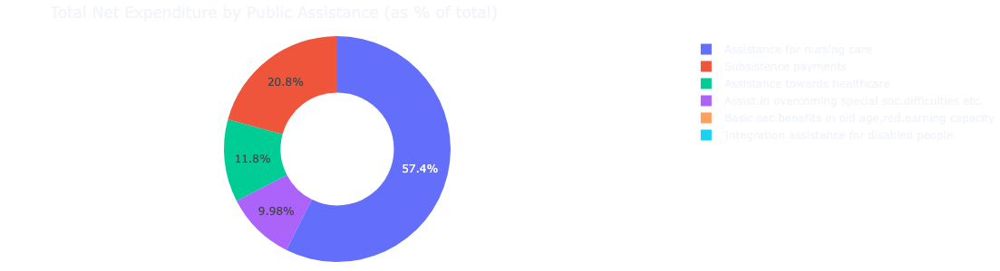

In [20]:
fig = px.pie(type_grouped_df, values='NetExpenditure(TEUR)', names='PublicAssistance', 
             title='Total Net Expenditure by Public Assistance (as % of total)',
             hole=0.5)  # Hole size for the donut chart

fig.update_traces(textposition='inside', textinfo='percent')  # Show percentages inside the donut chart
fig.update_layout(
    plot_bgcolor='rgba(0, 0, 0, 0)',
    paper_bgcolor='rgba(0, 0, 0, 0)',
    margin=dict(l=0, r=0, t=40, b=10),
    height=300,
    template="plotly_dark",
    hovermode='closest'
)
fig.show()

 ### SECOND DATASET

In [21]:
file_path = 'basic_security_benefits.csv'
with open(file_path, 'rb') as f:
    result = chardet.detect(f.read())
    detected_encoding = result['encoding']
    print(f'Detected encoding: {detected_encoding}')

Detected encoding: ISO-8859-1


In [22]:
with open(file_path, 'r', encoding=detected_encoding) as f:
    content = f.read()
    print(content[:500])

GENESIS-Tabelle: 22151-0032
Recipients of basic security benefits: Länder,;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
reference month per quarter, sex/age groups/location of;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
benefit provision/public assistance institutions;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
Basic security in old age,reduced earning capacity;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
Recipients of basic security benefits (number);;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
;;2015;2015;2015;


In [23]:
df = pd.read_csv(file_path, encoding=detected_encoding, delimiter=';', skiprows=6, skipfooter=4, engine="python")

df = df.drop(0).reset_index(drop=True)

df = df.iloc[:, [0, 1, 30, 31, 32, 33]]

df.columns = ["Länder", "Gender", "Q1", "Q2", "Q3", "Q4"]

df.head(10)

,Länder,Gender,Q1,Q2,Q3,Q4
0,Baden-Württemberg,Male,52500,53605,53725,54120
1,Baden-Württemberg,Female,53970,57410,58255,59560
2,Baden-Württemberg,Total,106470,111015,111975,113680
3,Bayern,Male,64580,66170,66665,67065
4,Bayern,Female,66920,71140,72895,73910
5,Bayern,Total,131495,137305,139555,140975
6,Berlin,Male,40540,42785,43325,43405
7,Berlin,Female,36485,38670,39440,39620
8,Berlin,Total,77025,81455,82765,83025
9,Brandenburg,Male,15620,15945,16075,16195


In [24]:
df.dtypes

Länder    object
Gender    object
Q1        object
Q2        object
Q3        object
Q4        object
dtype: object

In [25]:
# Convert the column using pd.to_numeric with errors='coerce' to handle non-numeric values
df['Q1'] = pd.to_numeric(df['Q1'], errors='coerce')
df['Q2'] = pd.to_numeric(df['Q2'], errors='coerce')
df['Q3'] = pd.to_numeric(df['Q3'], errors='coerce')
df['Q4'] = pd.to_numeric(df['Q4'], errors='coerce')
print("\nDataFrame after conversion using pd.to_numeric():")

df.head(25)


DataFrame after conversion using pd.to_numeric():


,Länder,Gender,Q1,Q2,Q3,Q4
0,Baden-Württemberg,Male,52500,53605,53725,54120
1,Baden-Württemberg,Female,53970,57410,58255,59560
2,Baden-Württemberg,Total,106470,111015,111975,113680
3,Bayern,Male,64580,66170,66665,67065
4,Bayern,Female,66920,71140,72895,73910
5,Bayern,Total,131495,137305,139555,140975
6,Berlin,Male,40540,42785,43325,43405
7,Berlin,Female,36485,38670,39440,39620
8,Berlin,Total,77025,81455,82765,83025
9,Brandenburg,Male,15620,15945,16075,16195


In [26]:
df = df[~df.apply(lambda row: row.astype(str).str.contains('Total').any(), axis=1)]

df.reset_index(drop=True, inplace=True)

df.head(50)

,Länder,Gender,Q1,Q2,Q3,Q4
0,Baden-Württemberg,Male,52500,53605,53725,54120
1,Baden-Württemberg,Female,53970,57410,58255,59560
2,Bayern,Male,64580,66170,66665,67065
3,Bayern,Female,66920,71140,72895,73910
4,Berlin,Male,40540,42785,43325,43405
5,Berlin,Female,36485,38670,39440,39620
6,Brandenburg,Male,15620,15945,16075,16195
7,Brandenburg,Female,10770,11435,11760,11945
8,Bremen,Male,8100,8180,8210,8275
9,Bremen,Female,8875,8985,9225,9270


In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

grouped_df = df.groupby(['Länder', "Gender"])[['Q1', 'Q2', 'Q3', 'Q4']].sum().reset_index()

grouped_df.head(20)

,Länder,Gender,Q1,Q2,Q3,Q4
0,Baden-Württemberg,Female,53970,57410,58255,59560
1,Baden-Württemberg,Male,52500,53605,53725,54120
2,Bayern,Female,66920,71140,72895,73910
3,Bayern,Male,64580,66170,66665,67065
4,Berlin,Female,36485,38670,39440,39620
5,Berlin,Male,40540,42785,43325,43405
6,Brandenburg,Female,10770,11435,11760,11945
7,Brandenburg,Male,15620,15945,16075,16195
8,Bremen,Female,8875,8985,9225,9270
9,Bremen,Male,8100,8180,8210,8275


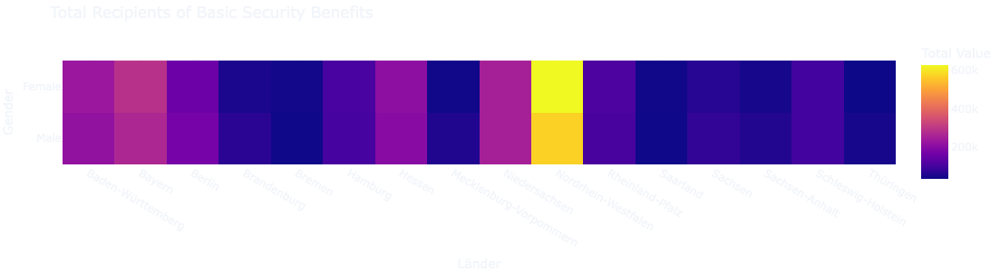

In [28]:
grouped_df['Total'] = grouped_df[['Q1', 'Q2', 'Q3', 'Q4']].sum(axis=1)

# Create a pivot table for the heatmap
pivot_table = grouped_df.pivot_table(values='Total', index='Gender', columns='Länder')

# Create the heatmap
fig = px.imshow(pivot_table, labels={'x': 'Länder', 'y': 'Gender', 'color': 'Total Value'}, title='Total Recipients of Basic Security Benefits')

fig.update_layout(
     plot_bgcolor='rgba(0, 0, 0, 0)',
     paper_bgcolor='rgba(0, 0, 0, 0)',
     margin=dict(l=0, r=0, t=40, b=10),
     height=300,
     template="plotly_dark",
     hovermode='closest'
    )
# Show the plot

fig.show()

# pivot_table.head()


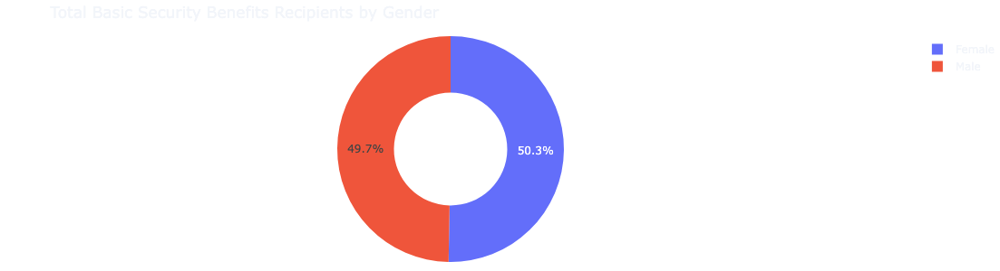

In [29]:
grouped_df['Total'] = grouped_df[['Q1', 'Q2', 'Q3', 'Q4']].sum(axis=1)
gender_totals = grouped_df.groupby('Gender')['Total'].sum().reset_index()

# Create the donut chart
fig = px.pie(gender_totals, values='Total', names='Gender', hole=0.5, title='Total Basic Security Benefits Recipients by Gender')

fig.update_layout(
    plot_bgcolor='rgba(0, 0, 0, 0)',
    paper_bgcolor='rgba(0, 0, 0, 0)',
    margin=dict(l=0, r=0, t=40, b=10),
    height=300,
    template="plotly_dark",
    hovermode='closest'
)

# Show the plot
fig.show()

In [30]:
grouped_df.head()

,Länder,Gender,Q1,Q2,Q3,Q4,Total
0,Baden-Württemberg,Female,53970,57410,58255,59560,229195
1,Baden-Württemberg,Male,52500,53605,53725,54120,213950
2,Bayern,Female,66920,71140,72895,73910,284865
3,Bayern,Male,64580,66170,66665,67065,264480
4,Berlin,Female,36485,38670,39440,39620,154215


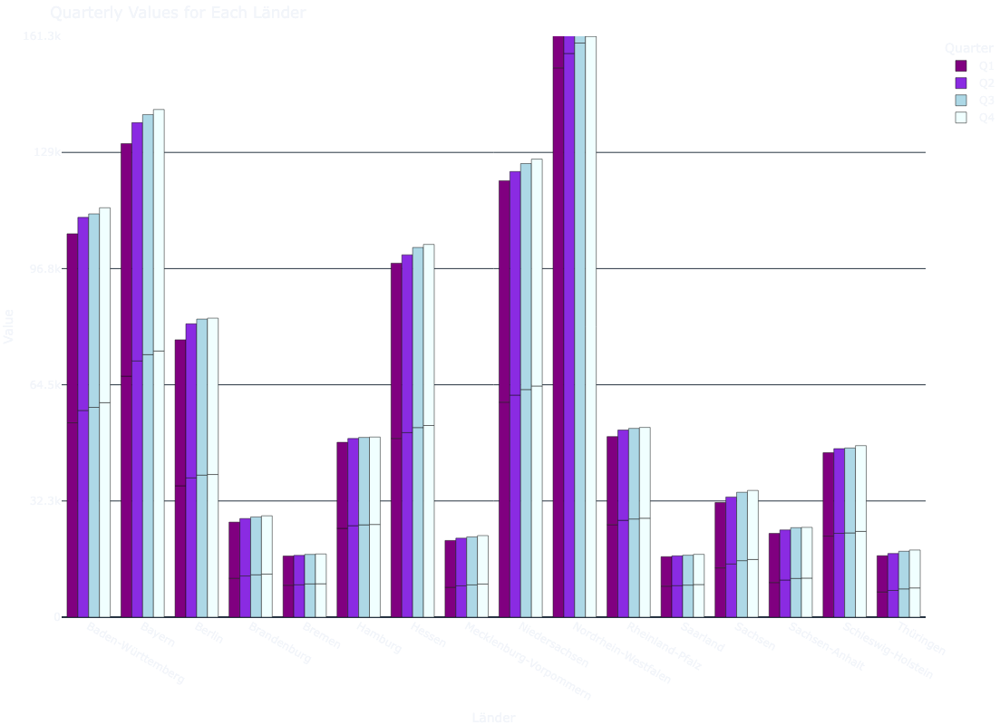

In [31]:
import plotly.graph_objects as go

bar_df = grouped_df[["Länder", "Q1", "Q2", "Q3", "Q4"]]

max_value = bar_df[['Q1', 'Q2', 'Q3', 'Q4']].max().max()

df_long = pd.melt(bar_df, id_vars=['Länder'], var_name='Quarter', value_name='Value')



# Create the grouped bar chart
fig = px.bar(df_long, x='Länder', y='Value', color='Quarter', barmode='group', 
             labels={'Value': 'Value', 'Länder': 'Länder'}, 
             title='Quarterly Values for Each Länder',
             color_discrete_sequence=["purple", "blueviolet", "lightblue", "azure"])

fig.update_yaxes(range=[0, max_value], tick0=0, dtick=(max_value // 5))

fig.update_layout(
    plot_bgcolor='rgba(0, 0, 0, 0)',
    paper_bgcolor='rgba(0, 0, 0, 0)',
    margin=dict(l=0, r=0, t=40, b=10),
    height=800,
    template="plotly_dark",
    hovermode='closest',
)
# Show the plot
fig.show()

In [32]:
grouped_df = df.groupby(['Länder', "Gender"])[['Q1', 'Q2', 'Q3', 'Q4']].sum().reset_index()
grouped_df['Total'] = grouped_df[['Q1', 'Q2', 'Q3', 'Q4']].sum(axis=1)
pivot_table = grouped_df.pivot_table(values='Total', index='Gender', columns='Länder')
type(pivot_table)

pandas.core.frame.DataFrame

In [33]:
grouped_df.head(25)

,Länder,Gender,Q1,Q2,Q3,Q4,Total
0,Baden-Württemberg,Female,53970,57410,58255,59560,229195
1,Baden-Württemberg,Male,52500,53605,53725,54120,213950
2,Bayern,Female,66920,71140,72895,73910,284865
3,Bayern,Male,64580,66170,66665,67065,264480
4,Berlin,Female,36485,38670,39440,39620,154215
5,Berlin,Male,40540,42785,43325,43405,170055
6,Brandenburg,Female,10770,11435,11760,11945,45910
7,Brandenburg,Male,15620,15945,16075,16195,63835
8,Bremen,Female,8875,8985,9225,9270,36355
9,Bremen,Male,8100,8180,8210,8275,32765


In [34]:
pivot_table.head()

Länder,Baden-Württemberg,Bayern,Berlin,Brandenburg,Bremen,Hamburg,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Nordrhein-Westfalen,Rheinland-Pfalz,Saarland,Sachsen,Sachsen-Anhalt,Schleswig-Holstein,Thüringen
Gender,,,,,,,,,,,,,,,,
Female,229195.0,284865.0,154215.0,45910.0,36355.0,101450.0,206765.0,35120.0,248755.0,629820.0,107345.0,35325.0,60165.0,41540.0,93000.0,30385.0
Male,213950.0,264480.0,170055.0,63835.0,32765.0,96640.0,198310.0,53040.0,249330.0,572450.0,99875.0,33150.0,74905.0,55715.0,94055.0,41300.0


#### Third Dataset

In [236]:
file_path = 'subsistence_benefits.csv'
with open(file_path, 'rb') as f:
    result = chardet.detect(f.read())
    detected_encoding = result['encoding']
    print(f'Detected encoding: {detected_encoding}')

Detected encoding: ISO-8859-1


In [237]:
with open(file_path, 'r', encoding=detected_encoding) as f:
    content = f.read()
    print(content[:500])

GENESIS-Tabelle: 22121-0011
Recipients of subsistence payments: Länder, reference date,;;;;;;;;;;;;;;;;;;;;;;;;;;;;
location of benefit provision, sex, nationality;;;;;;;;;;;;;;;;;;;;;;;;;;;;
Statistics of recipients of subsistence payments;;;;;;;;;;;;;;;;;;;;;;;;;;;;
Recipients of subsistence payments (number);;;;;;;;;;;;;;;;;;;;;;;;;;;;
;;Location of benefit provision;Location of benefit provision;Location of benefit provision;Location of benefit provision;Location of benefit provision;Locatio


In [238]:
pd.set_option("display.max_columns", None) 
df = pd.read_csv(file_path, encoding=detected_encoding, delimiter=';', skiprows=7, skipfooter=4, engine="python")
df.head()

,Unnamed: 0,Unnamed: 1,Male,Male.1,Male.2,Female,Female.1,Female.2,Total,Total.1,Total.2,Male.3,Male.4,Male.5,Female.3,Female.4,Female.5,Total.3,Total.4,Total.5,Male.6,Male.7,Male.8,Female.6,Female.7,Female.8,Total.6,Total.7,Total.8
0,NaN,NaN,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total
1,Baden-Württemberg,1995-12-31,72375,27109,99484,103775,28592,132367,176150,55701,231851,323,22,345,640,18,658,963,40,1003,72698,27131,99829,104415,28610,133025,177113,55741,232854
2,Baden-Württemberg,1996-12-31,75016,29642,104658,104882,30768,135650,179898,60410,240308,364,28,392,480,31,511,844,59,903,75380,29670,105050,105362,30799,136161,180742,60469,241211
3,Baden-Württemberg,1997-12-31,79013,32077,111090,109484,33317,142801,188497,65394,253891,201,24,225,286,20,306,487,44,531,79214,32101,111315,109770,33337,143107,188984,65438,254422
4,Baden-Württemberg,1998-12-31,74855,30234,105089,105241,33044,138285,180096,63278,243374,151,32,183,231,24,255,382,56,438,75006,30266,105272,105472,33068,138540,180478,63334,243812


In [239]:
def rename_columns(col):
    if col.startswith('Male.2') or col.startswith('Male.5') or col.startswith('Male.8'):
        return 'Total Males'
    elif col.startswith('Male.1') or col.startswith('Male.4') or col.startswith('Male.7'):
        return 'Foreign Males'
    elif col.startswith('Male') or col.startswith('Male.3') or col.startswith('Male.6'):
        return 'German Males'
    elif col.startswith('Female.2') or col.startswith('Female.5') or col.startswith('Female.8'):
        return 'Total Females'
    elif col.startswith('Female.1') or col.startswith('Female.4') or col.startswith('Female.7'):
        return 'Foreign Females'
    elif col.startswith('Female') or col.startswith('Female.3') or col.startswith('Male.6'):
        return 'German Females'
    elif col.startswith("Total.2") or col.startswith('Total.5') or col.startswith('Total.8'):
        return "Overall Recipients"
    elif col.startswith("Total.1") or col.startswith('Total.4') or col.startswith('Total.7'):
        return "Foreign Recipients Total"
    elif col.startswith("Total") or col.startswith('Total.3') or col.startswith('Total.6'):
        return "German Recipients Total"
    else:
        return col

# Apply the renaming function to the DataFrame's columns
df.columns = [rename_columns(col) for col in df.columns]

In [240]:
df.head()

,Unnamed: 0,Unnamed: 1,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients
0,NaN,NaN,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total
1,Baden-Württemberg,1995-12-31,72375,27109,99484,103775,28592,132367,176150,55701,231851,323,22,345,640,18,658,963,40,1003,72698,27131,99829,104415,28610,133025,177113,55741,232854
2,Baden-Württemberg,1996-12-31,75016,29642,104658,104882,30768,135650,179898,60410,240308,364,28,392,480,31,511,844,59,903,75380,29670,105050,105362,30799,136161,180742,60469,241211
3,Baden-Württemberg,1997-12-31,79013,32077,111090,109484,33317,142801,188497,65394,253891,201,24,225,286,20,306,487,44,531,79214,32101,111315,109770,33337,143107,188984,65438,254422
4,Baden-Württemberg,1998-12-31,74855,30234,105089,105241,33044,138285,180096,63278,243374,151,32,183,231,24,255,382,56,438,75006,30266,105272,105472,33068,138540,180478,63334,243812


In [241]:
df.rename(columns={"Unnamed: 0": "Länder", "Unnamed: 1": "Date"}, inplace=True)

In [242]:
df.head()

,Länder,Date,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients
0,NaN,NaN,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total,Germans,Foreigners,Total
1,Baden-Württemberg,1995-12-31,72375,27109,99484,103775,28592,132367,176150,55701,231851,323,22,345,640,18,658,963,40,1003,72698,27131,99829,104415,28610,133025,177113,55741,232854
2,Baden-Württemberg,1996-12-31,75016,29642,104658,104882,30768,135650,179898,60410,240308,364,28,392,480,31,511,844,59,903,75380,29670,105050,105362,30799,136161,180742,60469,241211
3,Baden-Württemberg,1997-12-31,79013,32077,111090,109484,33317,142801,188497,65394,253891,201,24,225,286,20,306,487,44,531,79214,32101,111315,109770,33337,143107,188984,65438,254422
4,Baden-Württemberg,1998-12-31,74855,30234,105089,105241,33044,138285,180096,63278,243374,151,32,183,231,24,255,382,56,438,75006,30266,105272,105472,33068,138540,180478,63334,243812


In [243]:
df = df.iloc[1:]
df['Date'] = df['Date'].str[:4]
df.rename(columns={"Date": "Year"}, inplace=True)
df.head()

,Länder,Year,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients
1,Baden-Württemberg,1995,72375,27109,99484,103775,28592,132367,176150,55701,231851,323,22,345,640,18,658,963,40,1003,72698,27131,99829,104415,28610,133025,177113,55741,232854
2,Baden-Württemberg,1996,75016,29642,104658,104882,30768,135650,179898,60410,240308,364,28,392,480,31,511,844,59,903,75380,29670,105050,105362,30799,136161,180742,60469,241211
3,Baden-Württemberg,1997,79013,32077,111090,109484,33317,142801,188497,65394,253891,201,24,225,286,20,306,487,44,531,79214,32101,111315,109770,33337,143107,188984,65438,254422
4,Baden-Württemberg,1998,74855,30234,105089,105241,33044,138285,180096,63278,243374,151,32,183,231,24,255,382,56,438,75006,30266,105272,105472,33068,138540,180478,63334,243812
5,Baden-Württemberg,1999,.,.,97179,.,.,129738,167138,59779,226917,.,.,132,.,.,172,297,7,304,69266,28045,97311,98169,31741,129910,167435,59786,227221


In [244]:
df["Year"] = df["Year"].astype(int)

In [245]:
# Define the year range to remove
start_year = 1995
end_year = 2010

# Filter out rows within the specified year range
df_filtered = df[~df['Year'].between(start_year, end_year)]

# Display the filtered DataFrame
print("\nFiltered DataFrame:")

df_filtered.head(50)


Filtered DataFrame:


,Länder,Year,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients
17,Baden-Württemberg,2011,2359,529,2888,2469,577,3046,4828,1106,5934,4529,276,4805,3538,206,3744,8067,482,8549,6888,805,7693,6007,783,6790,12895,1588,14483
18,Baden-Württemberg,2012,2413,468,2881,2611,544,3155,5024,1012,6036,4423,258,4681,3282,191,3473,7705,449,8154,6836,726,7562,5893,735,6628,12729,1461,14190
19,Baden-Württemberg,2013,2769,533,3302,2884,622,3506,5653,1155,6808,4448,275,4723,3441,188,3629,7889,463,8352,7217,808,8025,6325,810,7135,13542,1618,15160
20,Baden-Württemberg,2014,3038,568,3606,2940,664,3604,5978,1232,7210,4228,260,4488,3280,180,3460,7508,440,7948,7266,828,8094,6220,844,7064,13486,1672,15158
21,Baden-Württemberg,2015,3122,550,3672,3006,611,3617,6128,1161,7289,8178,428,8606,6968,339,7307,15146,767,15913,11300,978,12278,9974,950,10924,21274,1928,23202
22,Baden-Württemberg,2016,2882,588,3470,2790,645,3435,5672,1233,6905,9537,575,10112,7601,443,8044,17138,1018,18156,12419,1163,13582,10931,1088,11479,22810,2251,25061
23,Baden-Württemberg,2017,2836,617,3453,2772,633,3405,5608,1250,6858,11284,670,11954,8780,490,9270,20064,1160,21224,14120,1287,15407,11552,1123,12675,25672,2410,28082
24,Baden-Württemberg,2018,2838,754,3592,2588,725,3313,5426,1479,6905,11532,722,12254,9046,580,9626,20578,1302,21880,14370,1476,15846,11634,1305,12939,26004,2781,28785
25,Baden-Württemberg,2019,2609,697,3306,2377,717,3094,4986,1414,6400,11115,710,11825,8757,569,9326,19872,1279,21151,13724,1407,15131,11134,1286,12420,24858,2693,27551
26,Baden-Württemberg,2020,2895,750,3645,2515,770,3285,5410,1520,6935,5085,430,5510,4120,425,4545,9200,855,10055,7980,1180,9160,6635,1200,7830,14615,2375,16990


In [246]:
df_filtered.iloc[:, 2:] = df_filtered.iloc[:, 2:].map(lambda x: 0 if x in ['-', '.'] else x)

# Convert columns to numeric (integer)
df_filtered.iloc[:, 2:] = df_filtered.iloc[:, 2:].apply(pd.to_numeric)
df_filtered.head()

,Länder,Year,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients,German Males,Foreign Males,Total Males,German Females,Foreign Females,Total Females,German Recipients Total,Foreign Recipients Total,Overall Recipients
17,Baden-Württemberg,2011,2359,529,2888,2469,577,3046,4828,1106,5934,4529,276,4805,3538,206,3744,8067,482,8549,6888,805,7693,6007,783,6790,12895,1588,14483
18,Baden-Württemberg,2012,2413,468,2881,2611,544,3155,5024,1012,6036,4423,258,4681,3282,191,3473,7705,449,8154,6836,726,7562,5893,735,6628,12729,1461,14190
19,Baden-Württemberg,2013,2769,533,3302,2884,622,3506,5653,1155,6808,4448,275,4723,3441,188,3629,7889,463,8352,7217,808,8025,6325,810,7135,13542,1618,15160
20,Baden-Württemberg,2014,3038,568,3606,2940,664,3604,5978,1232,7210,4228,260,4488,3280,180,3460,7508,440,7948,7266,828,8094,6220,844,7064,13486,1672,15158
21,Baden-Württemberg,2015,3122,550,3672,3006,611,3617,6128,1161,7289,8178,428,8606,6968,339,7307,15146,767,15913,11300,978,12278,9974,950,10924,21274,1928,23202


In [247]:
df_filtered.dtypes

Länder                      object
Year                         int64
German Males                object
Foreign Males               object
Total Males                 object
German Females              object
Foreign Females             object
Total Females               object
German Recipients Total     object
Foreign Recipients Total    object
Overall Recipients          object
German Males                object
Foreign Males               object
Total Males                 object
German Females              object
Foreign Females             object
Total Females               object
German Recipients Total     object
Foreign Recipients Total    object
Overall Recipients          object
German Males                object
Foreign Males               object
Total Males                 object
German Females              object
Foreign Females             object
Total Females               object
German Recipients Total     object
Foreign Recipients Total    object
Overall Recipients  

In [249]:
first_two_cols = df_filtered.iloc[:, :2]

not_in_males = df_filtered.iloc[:, 2:5]
in_males = df_filtered.iloc[:, 11:14]

df_male = pd.concat([first_two_cols, not_in_males, in_males], axis=1)
df_male.head()

,Länder,Year,German Males,Foreign Males,Total Males,German Males,Foreign Males,Total Males
17,Baden-Württemberg,2011,2359,529,2888,4529,276,4805
18,Baden-Württemberg,2012,2413,468,2881,4423,258,4681
19,Baden-Württemberg,2013,2769,533,3302,4448,275,4723
20,Baden-Württemberg,2014,3038,568,3606,4228,260,4488
21,Baden-Württemberg,2015,3122,550,3672,8178,428,8606


In [250]:
first_two_cols = df_filtered.iloc[:, :2]

not_in_females = df_filtered.iloc[: , 5:8]
in_females = df_filtered.iloc[:, 14:17]

df_female = pd.concat([first_two_cols, not_in_females, in_females], axis=1)
df_female.head(50)

,Länder,Year,German Females,Foreign Females,Total Females,German Females,Foreign Females,Total Females
17,Baden-Württemberg,2011,2469,577,3046,3538,206,3744
18,Baden-Württemberg,2012,2611,544,3155,3282,191,3473
19,Baden-Württemberg,2013,2884,622,3506,3441,188,3629
20,Baden-Württemberg,2014,2940,664,3604,3280,180,3460
21,Baden-Württemberg,2015,3006,611,3617,6968,339,7307
22,Baden-Württemberg,2016,2790,645,3435,7601,443,8044
23,Baden-Württemberg,2017,2772,633,3405,8780,490,9270
24,Baden-Württemberg,2018,2588,725,3313,9046,580,9626
25,Baden-Württemberg,2019,2377,717,3094,8757,569,9326
26,Baden-Württemberg,2020,2515,770,3285,4120,425,4545


In [251]:
column_names = list(df_male.columns)
rename_index = column_names.index("German Males", 0)
column_names[rename_index] = "Non-institution German Males"
df_male.columns = column_names


df_male.head()

,Länder,Year,Non-institution German Males,Foreign Males,Total Males,German Males,Foreign Males,Total Males
17,Baden-Württemberg,2011,2359,529,2888,4529,276,4805
18,Baden-Württemberg,2012,2413,468,2881,4423,258,4681
19,Baden-Württemberg,2013,2769,533,3302,4448,275,4723
20,Baden-Württemberg,2014,3038,568,3606,4228,260,4488
21,Baden-Württemberg,2015,3122,550,3672,8178,428,8606


In [252]:
column_names = list(df_male.columns)
rename_index = column_names.index("German Males", 0)
column_names[rename_index] = "Institution German Males"
df_male.columns = column_names

df_male.head()

,Länder,Year,Non-institution German Males,Foreign Males,Total Males,Institution German Males,Foreign Males,Total Males
17,Baden-Württemberg,2011,2359,529,2888,4529,276,4805
18,Baden-Württemberg,2012,2413,468,2881,4423,258,4681
19,Baden-Württemberg,2013,2769,533,3302,4448,275,4723
20,Baden-Württemberg,2014,3038,568,3606,4228,260,4488
21,Baden-Württemberg,2015,3122,550,3672,8178,428,8606


In [253]:
column_names = list(df_male.columns)
rename_index = column_names.index("Foreign Males", 0)
column_names[rename_index] = "Foreign German Males"
df_male.columns = column_names

df_male.head()

,Länder,Year,Non-institution German Males,Foreign German Males,Total Males,Institution German Males,Foreign Males,Total Males
17,Baden-Württemberg,2011,2359,529,2888,4529,276,4805
18,Baden-Württemberg,2012,2413,468,2881,4423,258,4681
19,Baden-Württemberg,2013,2769,533,3302,4448,275,4723
20,Baden-Württemberg,2014,3038,568,3606,4228,260,4488
21,Baden-Württemberg,2015,3122,550,3672,8178,428,8606


In [254]:
column_names = list(df_male.columns)
rename_index = column_names.index("Foreign Males", 0)
column_names[rename_index] = "Institution Foreign Males"
df_male.columns = column_names

df_male.head()

,Länder,Year,Non-institution German Males,Foreign German Males,Total Males,Institution German Males,Institution Foreign Males,Total Males
17,Baden-Württemberg,2011,2359,529,2888,4529,276,4805
18,Baden-Württemberg,2012,2413,468,2881,4423,258,4681
19,Baden-Württemberg,2013,2769,533,3302,4448,275,4723
20,Baden-Württemberg,2014,3038,568,3606,4228,260,4488
21,Baden-Württemberg,2015,3122,550,3672,8178,428,8606


In [255]:
df_male.dtypes

Länder                          object
Year                             int64
Non-institution German Males    object
Foreign German Males            object
Total Males                     object
Institution German Males        object
Institution Foreign Males       object
Total Males                     object
dtype: object

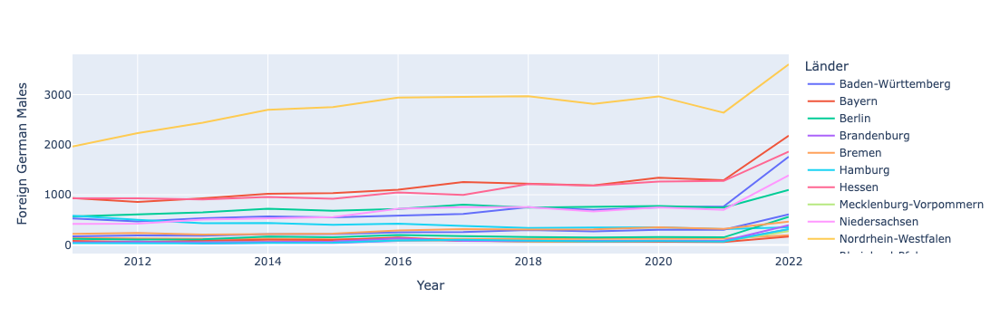

In [257]:
import plotly.express as px


fig = px.line(df_male, x="Year", y="Foreign German Males", color='Länder')


fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['Länder', 'Year', 'German Females', 'Foreign Females', 'Total Females', 'German Females', 'Foreign Females', 'Total Females'] but received: Foreign German Females